##### Name: Huiqi Wang
##### Github Username: wang2bbq
##### USC ID: 6613859213

# 1. Supervised, Semi-Supervised, and Unsupervised Learning

## a. Download the Breast Cancer Wisconsin (Diagnostic) Data Set

In [156]:
import pandas as pd
import numpy as np
df = pd.read_csv('../data/Homework 8 Data/wdbc.data', sep=',', header=None, names=['ID','Diagnosis','radius1','texture1','perimeter1','area1','smoothness1','compactness1','concavity1','concave points1','symmetry1','fractal dimension1','radius2','texture2','perimeter2','area2','smoothness2','compactness2','concavity2','concave points2','symmetry2','fractal dimension2','radius3','texture3','perimeter3','area3','smoothness3','compactness3','concavity3','concave points3','symmetry3','fractal dimension3'])
df

,ID,Diagnosis,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave points1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave points3,symmetry3,fractal dimension3
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


## b. Monte-Carlo Simulation

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
y = df['Diagnosis']
X = df.drop(['ID','Diagnosis'], axis=1)
M = 30

### i. Supervised Learning: Train an L1-penalized SVM to classify the data

In [158]:
acc_train_30 = []
acc_test_30 = []
precision_train_30 = []
precision_test_30 = []
recall_train_30 = []
recall_test_30 = []
f1_train_30 = []
f1_test_30 = []
auc_train_30 = []
auc_test_30 = []
model1 = None
x_train1 = None
x_test1 = None
y_train1 = None
y_test1 = None
for n in range(M):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y)
    X_train.index = range(len(X_train))
    y_train.index = range(len(y_train))
    X_test.index = range(len(X_test))
    y_test.index = range(len(y_test))
    acc_all = []
    for train_index, test_index in StratifiedKFold(shuffle=True).split(X_train, y_train):
        scaler = MinMaxScaler()
        x_train_n = scaler.fit_transform(X_train.iloc[train_index])
        x_test_n = scaler.transform(X_train.iloc[test_index])
        acc_per_split = []
        for c in np.logspace(-3, 6, 10):
            svc = LinearSVC(penalty='l1', loss='squared_hinge', C=c, dual=False, max_iter=5000).fit(x_train_n, y_train.iloc[train_index])
            acc = accuracy_score(y_train.iloc[test_index], svc.predict(x_test_n))
            acc_per_split.append(acc)
        acc_all.append(acc_per_split)
    acc_c = []
    for i in range(len(np.logspace(-3, 6, 10))):
        sum_ = 0
        for j in range(len(acc_all)):
            sum_ = sum_ + acc_all[j][i]
        acc_avg = sum_/len(acc_all)
        acc_c.append(acc_avg)
    best_ind = acc_c.index(max(acc_c))
    best_c = np.logspace(-3, 6, 10)[best_ind]
    # re-train
    scaler_b = MinMaxScaler()
    x_train_nor = scaler_b.fit_transform(X_train)
    x_test_nor = scaler_b.transform(X_test)
    svc_best = LinearSVC(penalty='l1', loss='squared_hinge', C=best_c, dual=False, max_iter=5000).fit(x_train_nor, y_train)
    if n == 29:
        model1 = svc_best
        x_train1 = x_train_nor
        x_test1 = x_test_nor
        y_train1 = y_train
        y_test1 = y_test

    # accuracy
    acc_train1 = accuracy_score(y_train, svc_best.predict(x_train_nor))
    acc_test1 = accuracy_score(y_test, svc_best.predict(x_test_nor))
    acc_train_30.append(acc_train1)
    acc_test_30.append(acc_test1)
    # precision, recall, f1-score
    dic_result_train = classification_report(y_train, svc_best.predict(x_train_nor), output_dict=True)
    dic_result_test = classification_report(y_test, svc_best.predict(x_test_nor), output_dict=True)
    precision_train1 = dic_result_train['M']['precision']
    recall_train1 = dic_result_train['M']['recall']
    f1_train1 = dic_result_train['M']['f1-score']
    precision_test1 = dic_result_test['M']['precision']
    recall_test1 = dic_result_test['M']['recall']
    f1_test1 = dic_result_test['M']['f1-score']
    precision_train_30.append(precision_train1)
    precision_test_30.append(precision_test1)
    recall_train_30.append(recall_train1)
    recall_test_30.append(recall_test1)
    f1_train_30.append(f1_train1)
    f1_test_30.append(f1_test1)
    #auc
    auc_train1= roc_auc_score(y_train, svc_best.decision_function(x_train_nor))
    auc_test1 = roc_auc_score(y_test, svc_best.decision_function(x_test_nor))
    auc_train_30.append(auc_train1)
    auc_test_30.append(auc_test1)
# average over 30 runs
ave_acc_train = sum(acc_train_30)/len(acc_train_30)
ave_precision_train = sum(precision_train_30)/len(precision_train_30)
ave_recall_train = sum(recall_train_30)/len(recall_train_30)
ave_f1_train = sum(f1_train_30)/len(f1_train_30)
ave_auc_train = sum(auc_train_30)/len(auc_train_30)

ave_acc_test = sum(acc_test_30)/len(acc_test_30)
ave_precision_test = sum(precision_test_30)/len(precision_test_30)
ave_recall_test = sum(recall_test_30)/len(recall_test_30)
ave_f1_test = sum(f1_test_30)/len(f1_test_30)
ave_auc_test = sum(auc_test_30)/len(auc_test_30)

print("For training data:")
print("average accuracy:", ave_acc_train)
print("average precision:", ave_precision_train)
print("average recall:", ave_recall_train)
print("average f1:", ave_f1_train)
print("average auc:", ave_auc_train)
print('---------------------------------------------------------------------------------')
print("For test data:")
print("average accuracy:", ave_acc_test)
print("average precision:", ave_precision_test)
print("average recall:", ave_recall_test)
print("average f1:", ave_f1_test)
print("average auc:", ave_auc_test)

/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarni

For training data:
average accuracy: 0.9851282051282052
average precision: 0.990019884255197
average recall: 0.9699999999999999
average f1: 0.9798737034357407
average auc: 0.9976835225318197
---------------------------------------------------------------------------------
For test data:
average accuracy: 0.9687134502923975
average precision: 0.9763363253734159
average recall: 0.9388888888888887
average f1: 0.9565320289622306
average auc: 0.9897376543209876


/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


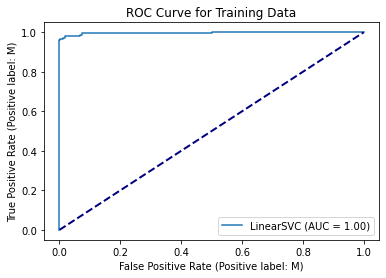

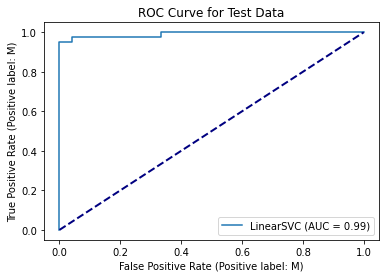

In [159]:
from sklearn.metrics import RocCurveDisplay
import matplotlib.pyplot as plt
# ROC for training data
RocCurveDisplay.from_estimator(model1, x_train1,list(y_train1))
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Training Data')
plt.show()

# ROC for test data
RocCurveDisplay.from_estimator(model1, x_test1,list(y_test1))
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Test Data')
plt.show()

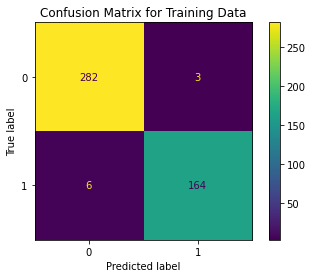

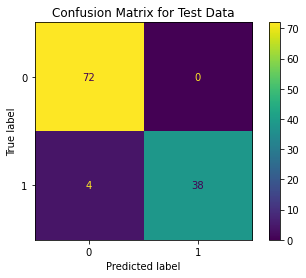

In [160]:
# Confusion matrix for training data
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred_train = model1.predict(x_train1)
cm_disp_train = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_train1),y_pred_train))
cm_disp_train.plot()
plt.title('Confusion Matrix for Training Data')
plt.show()

# Confusion matrix for test data
y_pred_test = model1.predict(x_test1)
cm_disp_test = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_test1),y_pred_test))
cm_disp_test.plot()
plt.title('Confusion Matrix for Test Data')
plt.show()

### ii. Semi-Supervised Learning/ Self-training

In [188]:
acc_train_30_2 = []
acc_test_30_2 = []
precision_train_30_2 = []
precision_test_30_2 = []
recall_train_30_2 = []
recall_test_30_2 = []
f1_train_30_2 = []
f1_test_30_2 = []
auc_train_30_2 = []
auc_test_30_2 = []
model2 = None
x_train2 = None
x_test2 = None
y_train2 = None
y_test2 = None

for n in range(M): 

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y)
   
    X_train.index = range(len(X_train))
    y_train.index = range(len(y_train))
    X_test.index = range(len(X_test))
    y_test.index = range(len(y_test))

    X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_train, y_train, test_size=0.5,stratify=y_train)

    X_labeled.index = range(len(X_labeled))
    y_labeled.index = range(len(y_labeled))
    X_unlabeled.index = range(len(X_unlabeled))
    y_unlabeled.index = range(len(y_unlabeled))

    while len(X_unlabeled)>0:
        acc_all = []
        for train_index, test_index in StratifiedKFold(shuffle=True).split(X_labeled, y_labeled):
            scaler = MinMaxScaler()
            x_train_n = scaler.fit_transform(X_labeled.iloc[train_index])
            x_test_n = scaler.transform(X_labeled.iloc[test_index])
            acc_per_split = []
            for c in np.logspace(-3, 6, 10):
                svc = LinearSVC(penalty='l1', loss='squared_hinge', C=c, dual=False, max_iter=5000).fit(x_train_n, y_labeled.iloc[train_index])
                acc = accuracy_score(y_labeled.iloc[test_index], svc.predict(x_test_n))
                acc_per_split.append(acc)
            acc_all.append(acc_per_split)
        acc_c = []
        for i in range(len(np.logspace(-3, 6, 10))):
            sum_ = 0
            for j in range(len(acc_all)):
                sum_ = sum_ + acc_all[j][i]
            acc_avg = sum_/len(acc_all)
            acc_c.append(acc_avg)
        best_ind = acc_c.index(max(acc_c))
        best_c = np.logspace(-3, 6, 10)[best_ind]

        # re-train
        scaler_b = MinMaxScaler()
        x_train_nor = scaler_b.fit_transform(X_labeled)
        x_test_nor = scaler_b.transform(X_unlabeled)
        svc_best = LinearSVC(penalty='l1', loss='squared_hinge', C=best_c, dual=False, max_iter=5000).fit(x_train_nor, y_labeled)
            
        far_point_ind = np.absolute(svc_best.decision_function(x_test_nor)).argmax()
        far_point_x_unnormal = X_unlabeled.iloc[far_point_ind]

        far_point_x_nor = x_test_nor[far_point_ind]
        pred_label = svc_best.predict(far_point_x_nor.reshape(1,-1))
        new_point_x = list(far_point_x_unnormal)
        new_point_y = list(pred_label)[0]

        X_labeled.loc[len(X_labeled)] = new_point_x
        y_labeled.loc[len(y_labeled)] = new_point_y
        X_unlabeled.drop(far_point_ind,axis=0,inplace=True)
        X_unlabeled.index = range(len(X_unlabeled))
        #y_unlabeled.drop(far_point_ind,axis=0)
    
    # re-train
    scaler2 = MinMaxScaler()
    x_train_nor2 = scaler2.fit_transform(X_train)
    x_test_nor2 = scaler2.transform(X_test)

    if n == 29:
        model2 = svc_best
        x_train2 = x_train_nor2
        x_test2 = x_test_nor2
        y_train2 = y_train
        y_test2 = y_test

    # accuracy
    acc_train2 = accuracy_score(y_train, svc_best.predict(x_train_nor2))
    acc_test2 = accuracy_score(y_test, svc_best.predict(x_test_nor2))
    acc_train_30_2.append(acc_train2)
    acc_test_30_2.append(acc_test2)
    # precision, recall, f1-score
    dic_result_train2 = classification_report(y_train, svc_best.predict(x_train_nor2), output_dict=True)
    dic_result_test2 = classification_report(y_test, svc_best.predict(x_test_nor2), output_dict=True)
    precision_train2 = dic_result_train2['M']['precision']
    recall_train2 = dic_result_train2['M']['recall']
    f1_train2 = dic_result_train2['M']['f1-score']
    precision_test2 = dic_result_test2['M']['precision']
    recall_test2 = dic_result_test2['M']['recall']
    f1_test2 = dic_result_test2['M']['f1-score']
    precision_train_30_2.append(precision_train2)
    precision_test_30_2.append(precision_test2)
    recall_train_30_2.append(recall_train2)
    recall_test_30_2.append(recall_test2)
    f1_train_30_2.append(f1_train2)
    f1_test_30_2.append(f1_test2)
    #auc
    auc_train2= roc_auc_score(y_train, svc_best.decision_function(x_train_nor2))
    auc_test2 = roc_auc_score(y_test, svc_best.decision_function(x_test_nor2))
    auc_train_30_2.append(auc_train2)
    auc_test_30_2.append(auc_test2)

# average over 30 runs
ave_acc_train2 = sum(acc_train_30_2)/len(acc_train_30_2)
ave_precision_train2 = sum(precision_train_30_2)/len(precision_train_30_2)
ave_recall_train2 = sum(recall_train_30_2)/len(recall_train_30_2)
ave_f1_train2 = sum(f1_train_30_2)/len(f1_train_30_2)
ave_auc_train2 = sum(auc_train_30_2)/len(auc_train_30_2)

ave_acc_test2 = sum(acc_test_30_2)/len(acc_test_30_2)
ave_precision_test2 = sum(precision_test_30_2)/len(precision_test_30_2)
ave_recall_test2 = sum(recall_test_30_2)/len(recall_test_30_2)
ave_f1_test2 = sum(f1_test_30_2)/len(f1_test_30_2)
ave_auc_test2 = sum(auc_test_30_2)/len(auc_test_30_2)

print("For training data:")
print("average accuracy:", ave_acc_train2)
print("average precision:", ave_precision_train2)
print("average recall:", ave_recall_train2)
print("average f1:", ave_f1_train2)
print("average auc:", ave_auc_train2)
print('---------------------------------------------------------------------------------')
print("For test data:")
print("average accuracy:", ave_acc_test2)
print("average precision:", ave_precision_test2)
print("average recall:", ave_recall_test2)
print("average f1:", ave_f1_test2)
print("average auc:", ave_auc_test2)


/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarni

For training data:
average accuracy: 0.9785347985347986
average precision: 0.9889313647418667
average recall: 0.9533333333333331
average f1: 0.9707139593582882
average auc: 0.994155486756106
---------------------------------------------------------------------------------
For test data:
average accuracy: 0.9614035087719294
average precision: 0.9702068731914688
average recall: 0.9246031746031745
average f1: 0.9463478056207622
average auc: 0.9895943562610229


/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


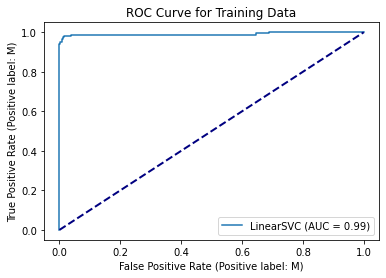

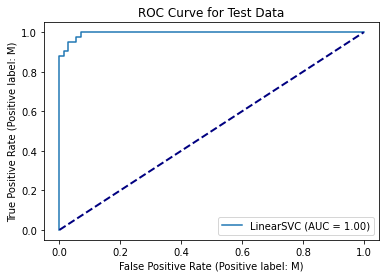

In [189]:
# ROC for training data
RocCurveDisplay.from_estimator(model2, x_train2,list(y_train2))
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Training Data')
plt.show()

# ROC for test data
RocCurveDisplay.from_estimator(model2, x_test2,list(y_test2))
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Test Data')
plt.show()

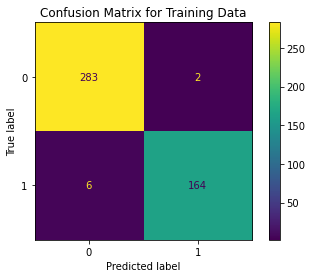

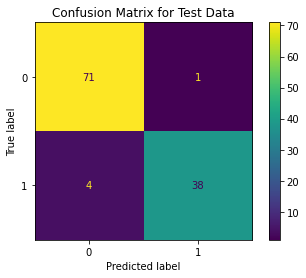

In [190]:
# Confusion matrix for training data
y_pred_train2 = model2.predict(x_train2)
cm_disp_train2 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_train2),y_pred_train2))
cm_disp_train2.plot()
plt.title('Confusion Matrix for Training Data')
plt.show()

# Confusion matrix for test data
y_pred_test2 = model2.predict(x_test2)
cm_disp_test2 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_test2),y_pred_test2))
cm_disp_test2.plot()
plt.title('Confusion Matrix for Test Data')
plt.show()

### iii. Unsupervised Learning

In [191]:
from sklearn.cluster import KMeans
from scipy.spatial import distance
from scipy.special import softmax
acc_train_30_3 = []
acc_test_30_3 = []
precision_train_30_3 = []
precision_test_30_3 = []
recall_train_30_3 = []
recall_test_30_3 = []
f1_train_30_3 = []
f1_test_30_3 = []
auc_train_30_3 = []
auc_test_30_3 = []
y_train3 = None
y_test3 = None
probabilities_3 = None
probabilities_test_3 = None
pred_labels_3 = None
pred_labels_test_3 = None
for n in range(M): 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y)
    X_train.index = range(len(X_train))
    y_train.index = range(len(y_train)) # true labels
    X_test.index = range(len(X_test))
    y_test.index = range(len(y_test))

    kmeans = KMeans(n_clusters=2, init='random', n_init=20).fit(X_train) # run the k-means algorithm n_init times
    centers = kmeans.cluster_centers_ # compute the centers of the two clusters

    x_train_0 = X_train[kmeans.labels_ == 0]
    y_train_0 = y_train[kmeans.labels_ == 0]
    x_train_0.index = range(len(x_train_0))
    y_train_0.index = range(len(y_train_0))
    x_train_1 = X_train[kmeans.labels_ == 1]
    y_train_1 = y_train[kmeans.labels_ == 1]
    x_train_1.index = range(len(x_train_1))
    y_train_1.index = range(len(y_train_1))
    distances0 = {}
    d0 = []
    distances1 = {}
    d1 = []
    for ind in range(len(x_train_0)):
        distances0[ind] = distance.euclidean(x_train_0.iloc[ind].values, centers[0])
    for ind in range(len(x_train_1)):
        distances1[ind] = distance.euclidean(x_train_1.iloc[ind].values, centers[1])   
    for k,v in distances0.items():
        d0.append((k,v))
    for k,v in distances1.items():
        d1.append((k,v))
    d0.sort(key=lambda x:x[1])
    d1.sort(key=lambda x:x[1])
    labels_0 = []
    labels_1 = []
    for j in range(30):
        labels_0.append(y_train_0[d0[j][0]])
    for j in range(30):
        labels_1.append(y_train_1[d1[j][0]])
    if labels_0.count('M') > labels_0.count('B'):
        pred_label_0 = 'M'
    else:
        pred_label_0 = 'B'

    if labels_1.count('M') > labels_1.count('B'):
        pred_label_1 = 'M'
    else:
        pred_label_1 = 'B'

    pred_labels = [] # labels predicted
    for l in kmeans.labels_:
        if l == 0:
            pred_labels.append(pred_label_0)
        elif l == 1:
            pred_labels.append(pred_label_1)

    # accuracy(training data)
    acc_train3 = accuracy_score(y_train, pred_labels)
    acc_train_30_3.append(acc_train3)
    # precision, recall, f1-score(training data)
    dic_result_train3 = classification_report(y_train, pred_labels, output_dict=True)
    precision_train3 = dic_result_train3['M']['precision']
    recall_train3 = dic_result_train3['M']['recall']
    f1_train3 = dic_result_train3['M']['f1-score']
    precision_train_30_3.append(precision_train3)
    recall_train_30_3.append(recall_train3)
    f1_train_30_3.append(f1_train3)
    #auc(training data)
    probabilities = []
    if pred_label_0 == 'M':
        for i in range(len(X_train)):
            probabilities.append((-1)* distance.euclidean(X_train.iloc[i].values, centers[0]))
    elif pred_label_1 == 'M':
        for i in range(len(X_train)):
            probabilities.append((-1)* distance.euclidean(X_train.iloc[i].values, centers[1]))    
    probabilities2 = softmax(probabilities)
    auc_train3= roc_auc_score(y_train, probabilities2)
    auc_train_30_3.append(auc_train3)

    # classify test data
    pred_labels_test = [] # labels predicted
    for i in range(len(X_test)):
        if distance.euclidean(X_test.iloc[i].values, centers[0]) < distance.euclidean(X_test.iloc[i].values, centers[1]):
            pred_labels_test.append(pred_label_0)
        else:
            pred_labels_test.append(pred_label_1)
    # accuracy(test data)
    acc_test3 = accuracy_score(y_test, pred_labels_test)
    acc_test_30_3.append(acc_test3)
    # precision, recall, f1-score(test data)
    dic_result_test3 = classification_report(y_test, pred_labels_test, output_dict=True)
    precision_test3 = dic_result_test3['M']['precision']
    recall_test3 = dic_result_test3['M']['recall']
    f1_test3 = dic_result_test3['M']['f1-score']
    precision_test_30_3.append(precision_test3)
    recall_test_30_3.append(recall_test3)
    f1_test_30_3.append(f1_test3)    
    #auc(test data)
    probabilities_test = []
    if pred_label_0 == 'M':
        for i in range(len(X_test)):
            probabilities_test.append((-1)* distance.euclidean(X_test.iloc[i].values, centers[0]))
    elif pred_label_1 == 'M':
        for i in range(len(X_test)):
            probabilities_test.append((-1)* distance.euclidean(X_test.iloc[i].values, centers[1]))    
    probabilities2_test = softmax(probabilities_test)
    auc_test3= roc_auc_score(y_test, probabilities2_test)
    auc_test_30_3.append(auc_test3)

    if n == 29:
        y_train3 = y_train
        y_test3 = y_test
        probabilities_3 = probabilities2
        probabilities_test_3 = probabilities2_test
        pred_labels_3 = pred_labels
        pred_labels_test_3 = pred_labels_test
# average over 30 runs
ave_acc_train3 = sum(acc_train_30_3)/len(acc_train_30_3)
ave_precision_train3 = sum(precision_train_30_3)/len(precision_train_30_3)
ave_recall_train3 = sum(recall_train_30_3)/len(recall_train_30_3)
ave_f1_train3 = sum(f1_train_30_3)/len(f1_train_30_3)
ave_auc_train3 = sum(auc_train_30_3)/len(auc_train_30_3)

ave_acc_test3 = sum(acc_test_30_3)/len(acc_test_30_3)
ave_precision_test3 = sum(precision_test_30_3)/len(precision_test_30_3)
ave_recall_test3 = sum(recall_test_30_3)/len(recall_test_30_3)
ave_f1_test3 = sum(f1_test_30_3)/len(f1_test_30_3)
ave_auc_test3 = sum(auc_test_30_3)/len(auc_test_30_3)

print("For training data:")
print("average accuracy:", ave_acc_train3)
print("average precision:", ave_precision_train3)
print("average recall:", ave_recall_train3)
print("average f1:", ave_f1_train3)
print("average auc:", ave_auc_train3)
print('---------------------------------------------------------------------------------')
print("For test data:")
print("average accuracy:", ave_acc_test3)
print("average precision:", ave_precision_test3)
print("average recall:", ave_recall_test3)
print("average f1:", ave_f1_test3)
print("average auc:", ave_auc_test3)


For training data:
average accuracy: 0.8493772893772896
average precision: 0.9915903857466845
average recall: 0.6019607843137254
average f1: 0.7489366429482975
average auc: 0.7932414860681116
---------------------------------------------------------------------------------
For test data:
average accuracy: 0.8573099415204676
average precision: 0.9951332481907194
average recall: 0.6158730158730158
average f1: 0.7585340897857343
average auc: 0.8089285714285717


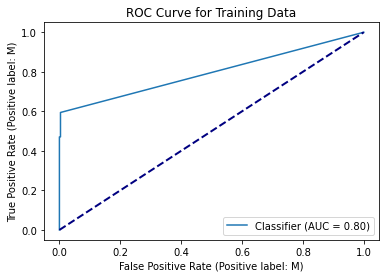

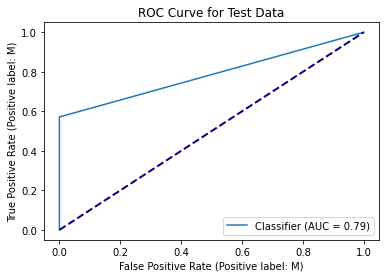

In [192]:
# ROC for training data
RocCurveDisplay.from_predictions(y_train3, probabilities_3, pos_label='M')
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Training Data')
plt.show()

# ROC for test data
RocCurveDisplay.from_predictions(y_test3, probabilities_test_3, pos_label='M')
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Test Data')
plt.show()

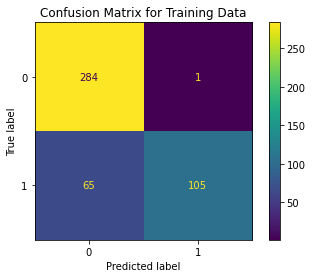

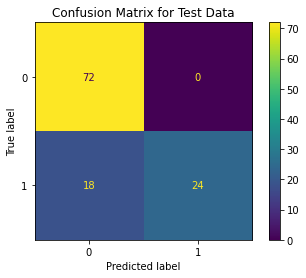

In [193]:
# Confusion matrix for training data
cm_disp_train3 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_train3),pred_labels_3))
cm_disp_train3.plot()
plt.title('Confusion Matrix for Training Data')
plt.show()

# Confusion matrix for test data
cm_disp_test3 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_test3),pred_labels_test_3))
cm_disp_test3.plot()
plt.title('Confusion Matrix for Test Data')
plt.show()

### iv. Spectral Clustering

In [183]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
acc_train_30_4 = []
precision_train_30_4 = []
recall_train_30_4 = []
f1_train_30_4 = []
auc_train_30_4 = []
acc_test_30_4 = []
precision_test_30_4 = []
recall_test_30_4 = []
f1_test_30_4 = []
auc_test_30_4 = []
fpr_train_3 = None
tpr_train_3 = None
fpr_test_3 = None
tpr_test_3 = None
for n in range(M): 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y)
    X_train.index = range(len(X_train))
    y_train.index = range(len(y_train))
    X_test.index = range(len(X_test))
    y_test.index = range(len(y_test))

    labels4 = SpectralClustering(n_clusters=2, gamma=1.0, affinity='rbf', assign_labels='cluster_qr').fit_predict(X_train)
    # labeling based on the entire points in each cluster
    labels_0 = []
    labels_1 = []
    x_train_0 = X_train[labels4 == 0]
    y_train_0 = y_train[labels4 == 0]
    x_train_0.index = range(len(x_train_0))
    y_train_0.index = range(len(y_train_0))
    for i in range(len(y_train_0)):
        labels_0.append(y_train_0[i])
    if labels_0.count('M') > labels_0.count('B'):
        pred_label_0 = 'M'                        # pred_label_0, pred_label_1 are the labels for cluster0 and cluster1
    else:
        pred_label_0 = 'B'
    x_train_1 = X_train[labels4 == 1]
    y_train_1 = y_train[labels4 == 1]
    x_train_1.index = range(len(x_train_1))
    y_train_1.index = range(len(y_train_1))
    for i in range(len(y_train_1)):
        labels_1.append(y_train_1[i])
    if labels_1.count('M') > labels_1.count('B'):
        pred_label_1 = 'M'
    else:
        pred_label_1 = 'B'

    pred_labels = [] # labels predicted
    for l in labels4:
        if l == 0:
            pred_labels.append(pred_label_0)
        elif l == 1:
            pred_labels.append(pred_label_1)

    # get cluster centroids
    center0 = x_train_0.mean().values
    center1 = x_train_1.mean().values
    # label the test data points
    pred_labels_test = [] # 'B'-'M' labels predicted
    labels4_test = [] # 0-1 labels predicted
    for i in range(len(X_test)):
        if distance.euclidean(X_test.iloc[i].values, center0) < distance.euclidean(X_test.iloc[i].values, center1):
            labels4_test.append(0)
            pred_labels_test.append(pred_label_0)
        else:
            labels4_test.append(1)
            pred_labels_test.append(pred_label_1)

    # accuracy(training data)
    acc_train4 = accuracy_score(y_train, pred_labels)
    acc_train_30_4.append(acc_train4)
    # precision, recall, f1-score(training data)
    dic_result_train4 = classification_report(y_train, pred_labels, output_dict=True, zero_division=0)
    precision_train4 = dic_result_train4['M']['precision']
    recall_train4 = dic_result_train4['M']['recall']
    f1_train4 = dic_result_train4['M']['f1-score']
    precision_train_30_4.append(precision_train4)
    recall_train_30_4.append(recall_train4)
    f1_train_30_4.append(f1_train4)
    #auc(training data)
    tpr_train = []
    fpr_train = []
    tpr_test = []
    fpr_test = []
    thresholds = np.linspace(1,0,21)
    for threshold in thresholds:
        pred_labels_roc = []
        pred_labels_roc_test = []
        for i in range(2):   
            if i == 0:    
                if labels_0.count('M')/len(labels_0) >= threshold:
                    pred_label_0_roc = 'M'
                else:
                    pred_label_0_roc = 'B'
            elif i == 1:
                if labels_1.count('M')/len(labels_1) >= threshold:
                    pred_label_1_roc = 'M'
                else:
                    pred_label_1_roc = 'B'             
        for l in labels4:
            if l == 0:
                pred_labels_roc.append(pred_label_0_roc) 
            else:
                pred_labels_roc.append(pred_label_1_roc)
        for l in labels4_test:
            if l == 0:
                pred_labels_roc_test.append(pred_label_0_roc)
            else:
                pred_labels_roc_test.append(pred_label_1_roc)

        tn_train, fp_train, fn_train, tp_train = confusion_matrix(y_train, pred_labels_roc).ravel()
        fpr = fp_train/(fp_train + tn_train)
        tpr = tp_train/(tp_train + fn_train)
        fpr_train.append(fpr)
        tpr_train.append(tpr)
        tn_test, fp_test, fn_test, tp_test = confusion_matrix(y_test, pred_labels_roc_test).ravel()
        fpr_t = fp_test/(fp_test + tn_test)
        tpr_t = tp_test/(tp_test + fn_test)
        fpr_test.append(fpr_t)
        tpr_test.append(tpr_t)
    auc_train4 = auc(fpr_train, tpr_train)
    auc_train_30_4.append(auc_train4)

    # Classify test data
    # accuracy(test data)
    acc_test4 = accuracy_score(y_test, pred_labels_test)
    acc_test_30_4.append(acc_test4)
    # precision, recall, f1-score(test data)
    dic_result_test4 = classification_report(y_test, pred_labels_test, output_dict=True, zero_division=0)
    precision_test4 = dic_result_test4['M']['precision']
    recall_test4 = dic_result_test4['M']['recall']
    f1_test4 = dic_result_test4['M']['f1-score']
    precision_test_30_4.append(precision_test4)
    recall_test_30_4.append(recall_test4)
    f1_test_30_4.append(f1_test4) 
    #auc(test data)
    auc_test4 = auc(fpr_test, tpr_test)
    auc_test_30_4.append(auc_test4)

    if n == 29:
        fpr_train_4 = fpr_train
        tpr_train_4 = tpr_train
        fpr_test_4 = fpr_test
        tpr_test_4 = tpr_test
        y_train4 = y_train
        y_test4 = y_test
        pred_labels_4 = pred_labels
        pred_labels_test_4 = pred_labels_test

# average over 30 runs
ave_acc_train4 = sum(acc_train_30_4)/len(acc_train_30_4)
ave_precision_train4 = sum(precision_train_30_4)/len(precision_train_30_4)
ave_recall_train4 = sum(recall_train_30_4)/len(recall_train_30_4)
ave_f1_train4 = sum(f1_train_30_4)/len(f1_train_30_4)
ave_auc_train4 = sum(auc_train_30_4)/len(auc_train_30_4)

ave_acc_test4 = sum(acc_test_30_4)/len(acc_test_30_4)
ave_precision_test4 = sum(precision_test_30_4)/len(precision_test_30_4)
ave_recall_test4 = sum(recall_test_30_4)/len(recall_test_30_4)
ave_f1_test4 = sum(f1_test_30_4)/len(f1_test_30_4)
ave_auc_test4 = sum(auc_test_30_4)/len(auc_test_30_4)

print("For training data:")
print("average accuracy:", ave_acc_train4)
print("average precision:", ave_precision_train4)
print("average recall:", ave_recall_train4)
print("average f1:", ave_f1_train4)
print("average auc:", ave_auc_train4)
print('---------------------------------------------------------------------------------')
print("For test data:")
print("average accuracy:", ave_acc_test4)
print("average precision:", ave_precision_test4)
print("average recall:", ave_recall_test4)
print("average f1:", ave_f1_test4)
print("average auc:", ave_auc_test4)

/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warni

For training data:
average accuracy: 0.6386813186813186
average precision: 0.16638260211446768
average recall: 0.13372549019607843
average f1: 0.13376228667975487
average auc: 0.5475868593051256
---------------------------------------------------------------------------------
For test data:
average accuracy: 0.7002923976608189
average precision: 0.25423740909949083
average recall: 0.19761904761904764
average f1: 0.22143316429168022
average auc: 0.8757605820105819


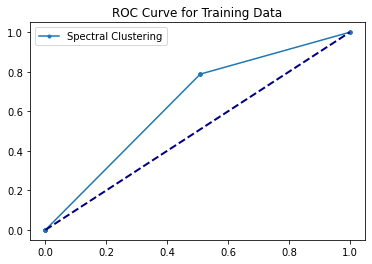

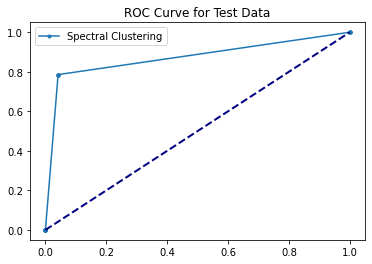

In [184]:
# ROC for training data
plt.plot(fpr_train_4, tpr_train_4, marker='.', label='Spectral Clustering')
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Training Data')
plt.legend()
plt.show()
# ROC for test data
plt.plot(fpr_test_4, tpr_test_4, marker='.', label='Spectral Clustering')
plt.plot([0, 1], [0, 1], color="navy", linewidth=2, linestyle="--")
plt.title('ROC Curve for Test Data')
plt.legend()
plt.show()

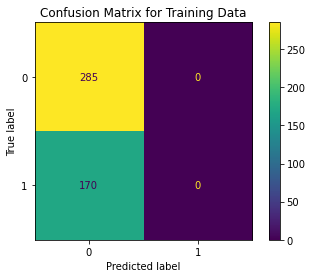

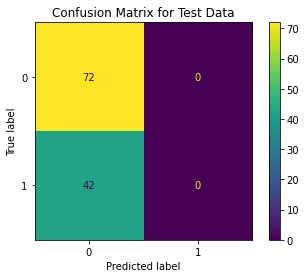

In [194]:
# Confusion matrix for training data
cm_disp_train4 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_train4),pred_labels_4))
cm_disp_train4.plot()
plt.title('Confusion Matrix for Training Data')
plt.show()

# Confusion matrix for test data
cm_disp_test4 = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(list(y_test4),pred_labels_test_4))
cm_disp_test4.plot()
plt.title('Confusion Matrix for Test Data')
plt.show()

### v. Compare the results you obtained by those methods

In [196]:
# Compare the results
dic_compare = {}
dic_compare['Accuracy(training)'] = [ave_acc_train, ave_acc_train2, ave_acc_train3, ave_acc_train4]
dic_compare['Precision(training)'] = [ave_precision_train, ave_precision_train2, ave_precision_train3, ave_precision_train4]
dic_compare['Recall(training)'] = [ave_recall_train, ave_recall_train2, ave_recall_train3, ave_recall_train4]
dic_compare['F1-score(training)'] = [ave_f1_train, ave_f1_train2, ave_f1_train3, ave_f1_train4]
dic_compare['AUC(training)'] = [ave_auc_train, ave_auc_train2, ave_auc_train3, ave_auc_train4]
dic_compare['Accuracy(test)'] = [ave_acc_test, ave_acc_test2, ave_acc_test3, ave_acc_test4]
dic_compare['Precision(test)'] = [ave_precision_test, ave_precision_test2, ave_precision_test3, ave_precision_test4]
dic_compare['Recall(test)'] = [ave_recall_test, ave_recall_test2, ave_recall_test3, ave_recall_test4]
dic_compare['F1-score(test)'] = [ave_f1_test, ave_f1_test2, ave_f1_test3, ave_f1_test4]
dic_compare['AUC(test)'] = [ave_auc_test, ave_auc_test2, ave_auc_test3, ave_auc_test4]
comp_index = ['Supervised Learning','Semi-Supervised Learning','K-means Clustering', 'Spectral Clustering']

df_compare = pd.DataFrame(dic_compare)
df_compare.index = comp_index
df_compare

,Accuracy(training),Precision(training),Recall(training),F1-score(training),AUC(training),Accuracy(test),Precision(test),Recall(test),F1-score(test),AUC(test)
Supervised Learning,0.985128,0.990020,0.970000,0.979874,0.997684,0.968713,0.976336,0.938889,0.956532,0.989738
Semi-Supervised Learning,0.978535,0.988931,0.953333,0.970714,0.994155,0.961404,0.970207,0.924603,0.946348,0.989594
K-means Clustering,0.849377,0.991590,0.601961,0.748937,0.793241,0.857310,0.995133,0.615873,0.758534,0.808929
Spectral Clustering,0.638681,0.166383,0.133725,0.133762,0.547587,0.700292,0.254237,0.197619,0.221433,0.875761


Findings:
The supervised learning with the whole training data set performs better than semi-supervised learning with half of the data set labeled. And unsupervised learning underperforms on this data set.

# 2. Active Learning Using Support Vector Machines

## a. Download the banknote authentication Data Set

In [197]:
df2 = pd.read_csv('../data/Homework 8 Data/data_banknote_authentication.txt', sep=',', header=None, names=['variance','skewness','curtosis','entropy','class'])
df2

,variance,skewness,curtosis,entropy,class
0,3.62160,8.66610,-2.8073,-0.44699,0
1,4.54590,8.16740,-2.4586,-1.46210,0
2,3.86600,-2.63830,1.9242,0.10645,0
3,3.45660,9.52280,-4.0112,-3.59440,0
4,0.32924,-4.45520,4.5718,-0.98880,0
...,...,...,...,...,...
1367,0.40614,1.34920,-1.4501,-0.55949,1
1368,-1.38870,-4.87730,6.4774,0.34179,1
1369,-3.75030,-13.45860,17.5932,-2.77710,1
1370,-3.56370,-8.38270,12.3930,-1.28230,1


In [198]:
y_a = df2['class']
X_a = df2.drop(['class'], axis=1)
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X_a, y_a, test_size=472)
X_train_a.index = range(len(X_train_a))
y_train_a.index = range(len(y_train_a))
X_test_a.index = range(len(X_test_a))
y_test_a.index = range(len(y_test_a))

## b. Repeat each of the following two procedures 50 times. You will have 50 errors for 90 SVMs per each procedure

In [199]:
N = 50

### i. passive learning

In [201]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
errors_50_passive = []
for n in range(N):
    X_train_pool, X_remain_pool, y_train_pool, y_remain_pool = train_test_split(X_train_a, y_train_a, train_size=10)
    while len(set(y_train_pool)) == 1:
        X_train_pool, X_remain_pool, y_train_pool, y_remain_pool = train_test_split(X_train_a, y_train_a, train_size=10)
    X_train_pool.index = range(len(X_train_pool))
    y_train_pool.index = range(len(y_train_pool))
    X_remain_pool.index = range(len(X_remain_pool))
    y_remain_pool.index = range(len(y_remain_pool))
    parameters = {'C':np.logspace(-3, 6, 10)}
    errors = {}
    num = 1
    flag = True
    while flag:
        svc = LinearSVC(penalty='l1', loss='squared_hinge', dual=False, max_iter=5000)
        clf = GridSearchCV(svc, parameters, cv=5).fit(X_train_pool, y_train_pool)
        y_pred_test_a = clf.best_estimator_.predict(X_test_a)
        acc = accuracy_score(y_test_a, y_pred_test_a)
        err = 1 - acc
        errors[num] = err
        if len(X_remain_pool)>10:
            X_train_add, X_remain_pool, y_train_add, y_remain_pool = train_test_split(X_remain_pool, y_remain_pool, train_size=10)
            X_train_add.index = range(len(X_train_add))
            y_train_add.index = range(len(y_train_add))
            X_remain_pool.index = range(len(X_remain_pool))
            y_remain_pool.index = range(len(y_remain_pool))
        elif len(X_remain_pool) == 10:
            X_train_add = X_remain_pool
            y_train_add = y_remain_pool
            X_remain_pool = []
            y_remain_pool = []
        else:
            break
        X_train_pool = pd.concat([X_train_pool, X_train_add], ignore_index=True)
        y_train_pool = pd.concat([y_train_pool, y_train_add], ignore_index=True)
        num+=1
    errors_50_passive.append(errors)

/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:

### ii. active learning

In [202]:
errors_50_active = []
for n in range(N):
    X_train_pool, X_remain_pool, y_train_pool, y_remain_pool = train_test_split(X_train_a, y_train_a, train_size=10)
    while len(set(y_train_pool)) == 1:
        X_train_pool, X_remain_pool, y_train_pool, y_remain_pool = train_test_split(X_train_a, y_train_a, train_size=10)
    X_train_pool.index = range(len(X_train_pool))
    y_train_pool.index = range(len(y_train_pool))
    X_remain_pool.index = range(len(X_remain_pool))
    y_remain_pool.index = range(len(y_remain_pool))
    parameters = {'C':np.logspace(-3, 6, 10)}
    errors = {}
    num = 1
    flag = True
    while flag:
        svc = LinearSVC(penalty='l1', loss='squared_hinge', dual=False, max_iter=5000)
        clf = GridSearchCV(svc, parameters, cv=5).fit(X_train_pool, y_train_pool)
        y_pred_test_a = clf.best_estimator_.predict(X_test_a)
        acc = accuracy_score(y_test_a, y_pred_test_a)
        err = 1 - acc
        errors[num] = err
        if X_remain_pool.empty:
            flag = False
        elif len(X_remain_pool) >= 10:
            # find the 10 closest data points
            distances = {}
            ds = []
            abs_confidence_scores = np.absolute(clf.best_estimator_.decision_function(X_remain_pool))
            for i in range(len(X_remain_pool)):
                distances[i]=abs_confidence_scores[i]
            for k,v in distances.items():
                ds.append((k,v))
            ds.sort(key=lambda x:x[1])
            # add the 10 closest data points
            for k in range(10):
                X_train_add = X_remain_pool.iloc[ds[k][0]]
                X_train_pool.loc[len(X_train_pool)] = X_train_add
                y_train_add = y_remain_pool.iloc[ds[k][0]]
                y_train_pool = pd.concat([y_train_pool, pd.Series(y_train_add)], ignore_index=True)
            # delete 10 points from the remain
            X_remain_pool.drop([ds[k][0] for k in range(10)],axis=0,inplace=True)
            X_remain_pool.index = range(len(X_remain_pool))
            y_remain_pool.drop([ds[k][0] for k in range(10)],axis=0,inplace=True)
            y_remain_pool.index = range(len(y_remain_pool))
            num+=1
    errors_50_active.append(errors)

/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/wanghuiqi/.local/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarni

## c. Average the 50 test errors for each of the incrementally trained 90 SVMs in 2(b)i and 2(b)ii

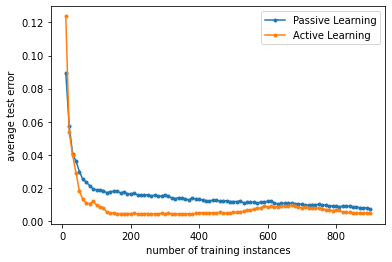

In [203]:
# passive learning
avg_err_passive = {}
for i in range(1,91):
    err_sum = 0
    for j in range(50):
        err_sum = err_sum + errors_50_passive[j][i]
    avg_err_per_svm = err_sum/50
    avg_err_passive[i*10] = avg_err_per_svm

# active learning
avg_err_active = {}
for i in range(1,91):
    err_sum = 0
    for j in range(50):
        err_sum = err_sum + errors_50_active[j][i]
    avg_err_per_svm = err_sum/50
    avg_err_active[i*10] = avg_err_per_svm

fig, ax = plt.subplots()
ax.plot(list(avg_err_passive.keys()), list(avg_err_passive.values()), marker='.', label='Passive Learning')
ax.plot(list(avg_err_active.keys()), list(avg_err_active.values()), marker='.', label='Active Learning')
ax.set_xlabel('number of training instances')
ax.set_ylabel('average test error')
plt.legend()
plt.show()

Conclusions: 
The average test error of the active learner is lower than the average test error of the passive learner when training samples are small.  When training samples become large, the two learners perform similarly.